### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [1]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

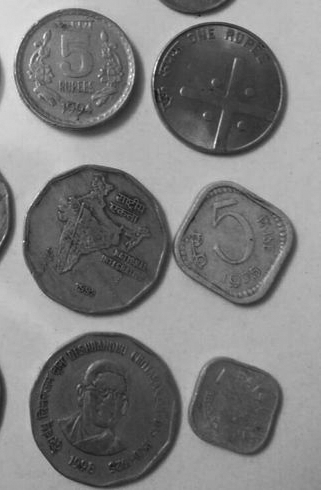

In [2]:
# 1A
monety_szare = cv2.imread('Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

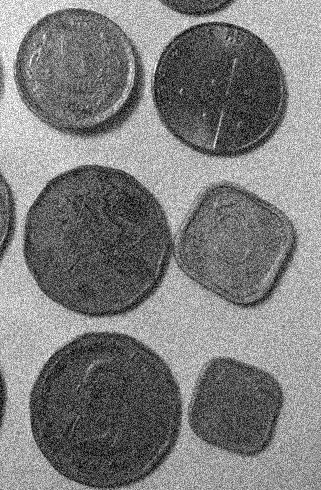

In [3]:
# 1B
monety_szare_szum = cv2.imread('Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

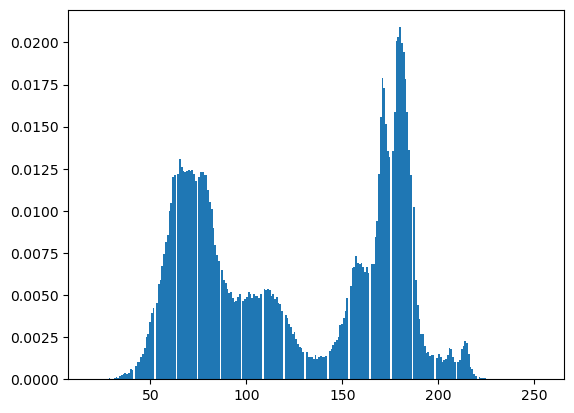

In [4]:
monety_szare = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)
_ = plt.hist(monety_szare.flatten(), bins=256, density=True)

In [5]:
(T1, bin_monety) = cv2.threshold(monety_szare, 130, 255, cv2.THRESH_BINARY_INV)

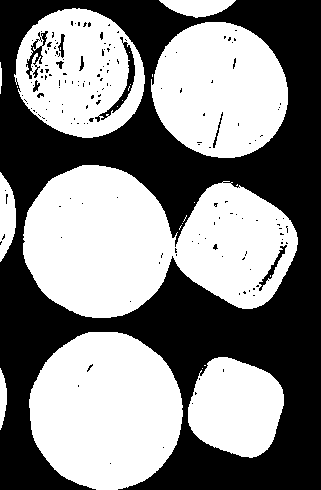

In [6]:
Image.fromarray(bin_monety)

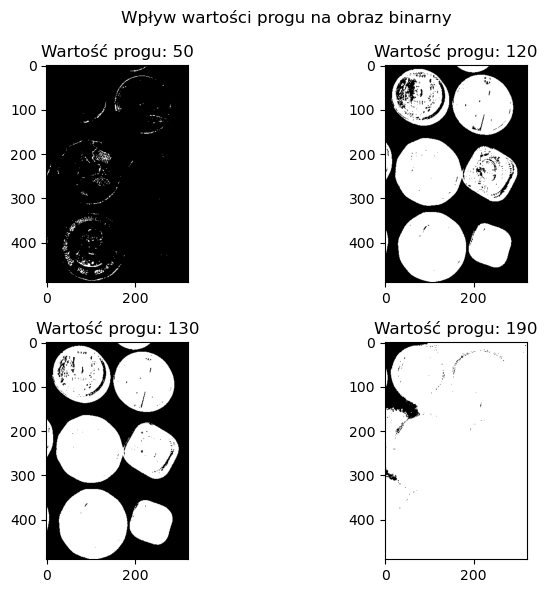

In [54]:
plt.figure(figsize = (8, 6))
plt.suptitle('Wpływ wartości progu na obraz binarny')

for i, ws in enumerate([50, 120, 130, 190]):
    plt.subplot(2, 2, i + 1)  
    plt.imshow(cv2.threshold(monety_szare, ws, 255, cv2.THRESH_BINARY_INV)[1], cmap='gray')
    plt.title('Wartość progu: ' + str(ws))

plt.tight_layout()
plt.show()

Rozwiązanie części 1B:


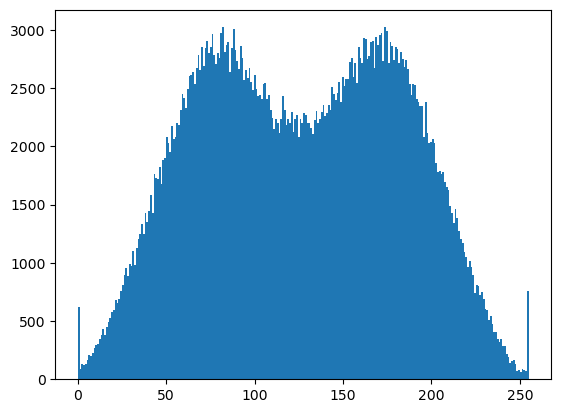

In [8]:
_ = plt.hist(monety_szare_szum.flatten(), bins=256)

In [9]:

(Td, bin_monety_szum) = cv2.threshold(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY), 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print('Próg dla monety_szare_szum:', Td)

Próg dla monety_szare_szum: 125.0


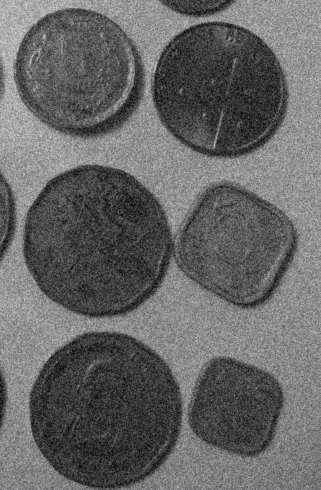

In [10]:
kernel_blur = np.array([[1, 4, 1], 
                        [4, 32, 4], 
                        [1, 4, 1]])


Output_image1 = cv2.filter2D(src=monety_szare_szum, ddepth=-1, kernel=kernel_blur)

Image.fromarray(Output_image1)

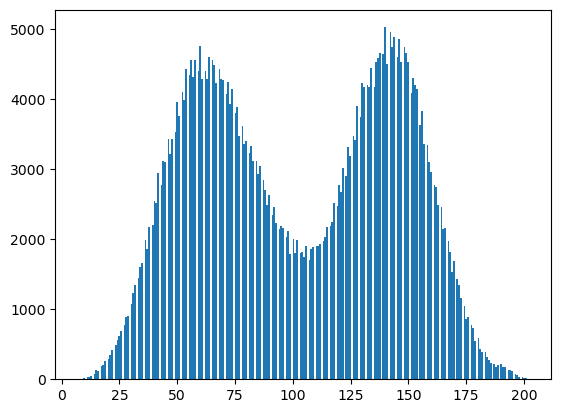

In [11]:
_ = plt.hist(Output_image1.flatten(), bins=256)

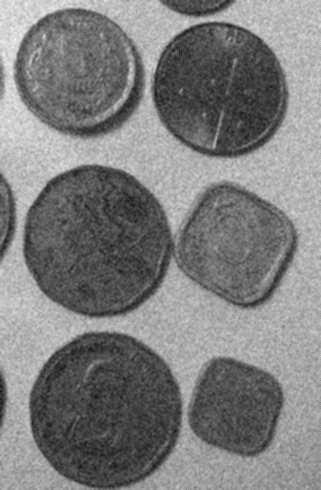

In [12]:
kernel_blur = np.array([[1, 1, 1], 
                        [1, 1, 1], 
                        [1, 1, 1]])/9

Output_image2 = cv2.filter2D(src=monety_szare_szum, ddepth=-1, kernel=kernel_blur)

Image.fromarray(Output_image2)

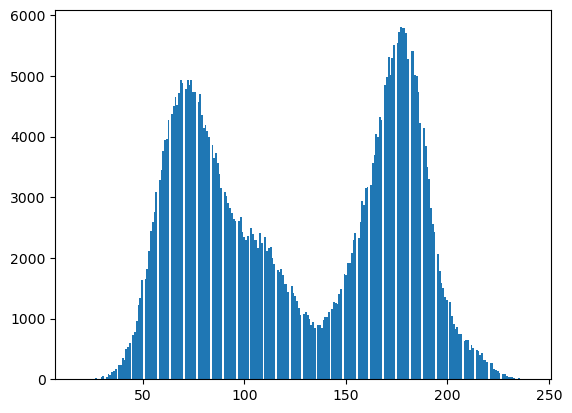

In [13]:
_ = plt.hist(Output_image2.flatten(), bins=256)

In [14]:

(T2, bin_monety_szum) = cv2.threshold(cv2.cvtColor(Output_image2, cv2.COLOR_BGR2GRAY), 130, 255, cv2.THRESH_BINARY_INV)

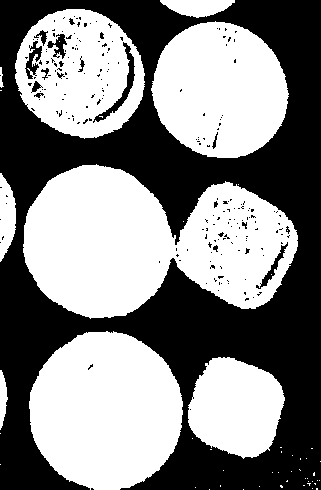

In [15]:
Image.fromarray(bin_monety_szum)

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

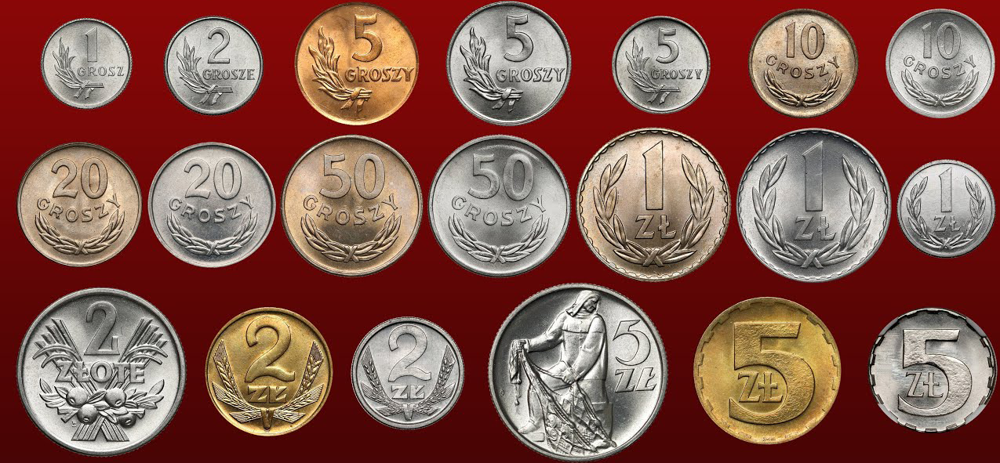

In [2]:
# 2A
monety_kolor = cv2.imread('Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

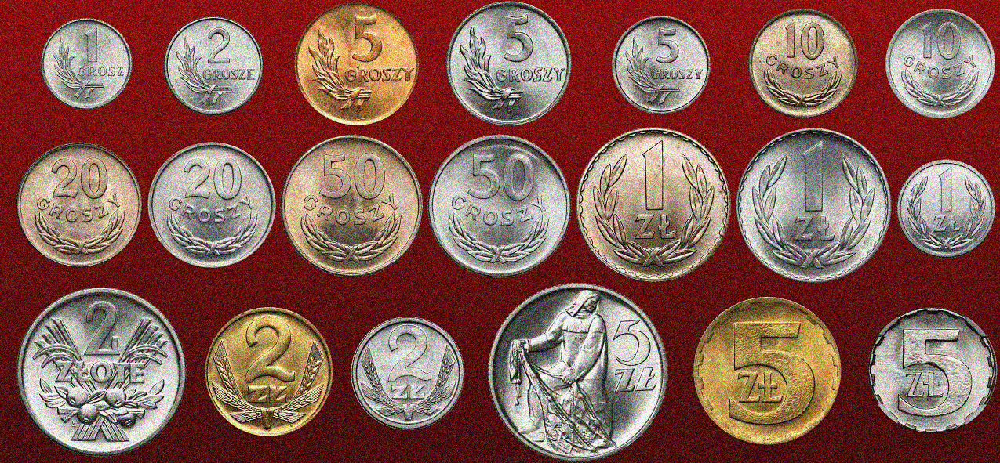

In [3]:
# 2B
monety_kolor_szum = cv2.imread('Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

In [4]:
monety_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_RGB2HSV)
h,s,v = cv2.split(monety_hsv)

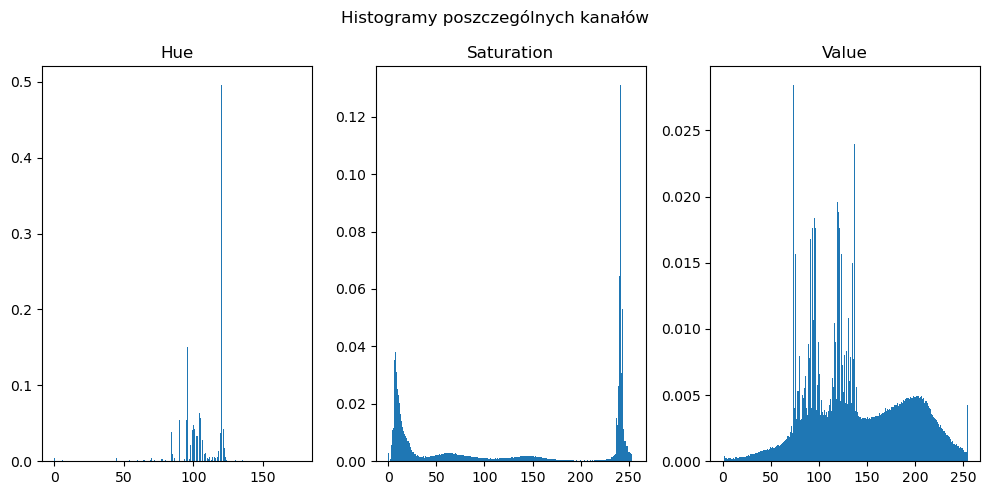

In [5]:
plt.figure(figsize=(10, 5))
plt.suptitle('Histogramy poszczególnych kanałów')

plt.subplot(1, 3, 1)
plt.hist(h.flatten(), bins=256, density=True)
plt.title('Hue')

plt.subplot(1, 3, 2)
plt.hist(s.flatten(), bins=256, density=True)
plt.title('Saturation')

plt.subplot(1, 3, 3)
plt.hist(v.flatten(), bins=256, density=True)
plt.title('Value')

plt.tight_layout()

In [6]:
(T, monety_kol_bin) = cv2.threshold(s, 200, 255, cv2.THRESH_BINARY_INV)

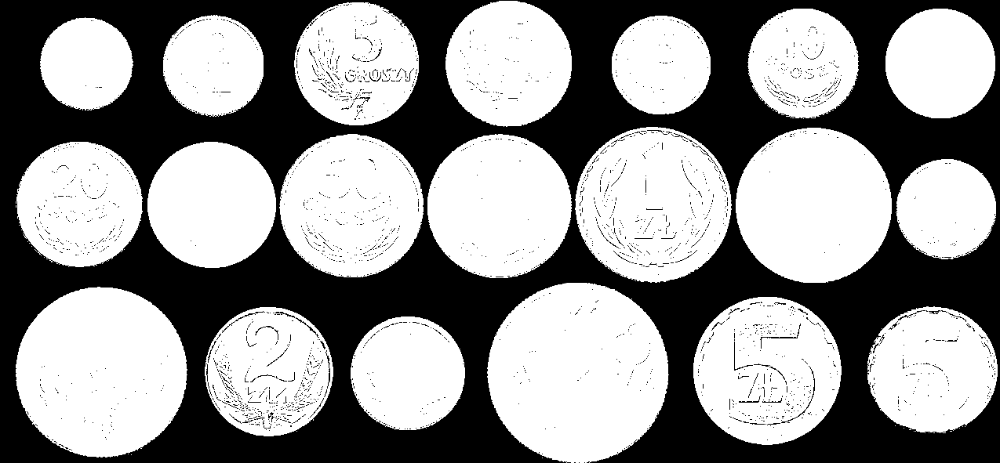

In [7]:
Image.fromarray(monety_kol_bin)

Rozwiązanie części 2B:


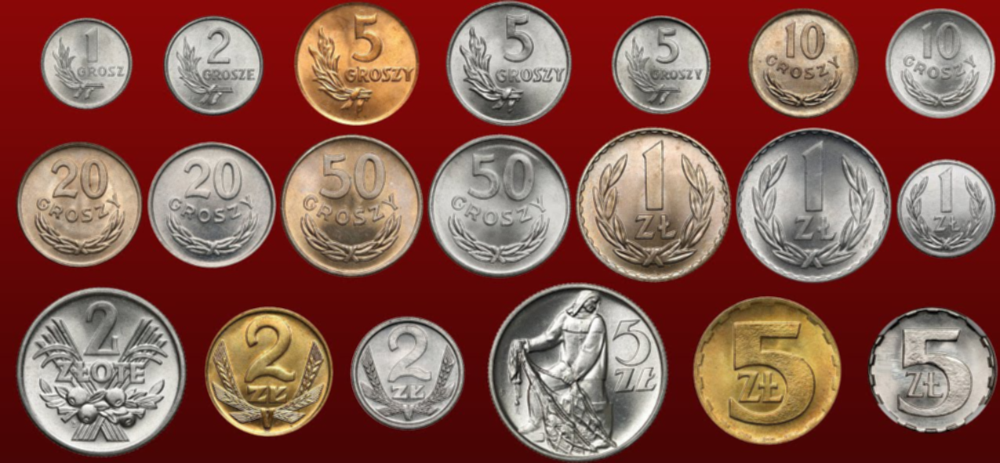

In [8]:
monety_kolor_szum = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB)
r, g, b = cv2.split(monety_kolor_szum)
kernel_blur_matrix = np.array([[1, 1, 1], 
                               [1, 1, 1], 
                               [1, 1, 1]])/9

r_filtered = cv2.filter2D(src=r, ddepth=-1, kernel=kernel_blur_matrix)
g_filtered = cv2.filter2D(src=g, ddepth=-1, kernel=kernel_blur_matrix)
b_filtered = cv2.filter2D(src=b, ddepth=-1, kernel=kernel_blur_matrix)

monety_kolor_szum_filtered = cv2.merge([r_filtered, g_filtered, b_filtered])
Image.fromarray(monety_kolor_szum_filtered)

In [9]:
monety_szum_hsv = cv2.cvtColor(monety_kolor_szum_filtered, cv2.COLOR_RGB2HSV)
h2,s2,v2 = cv2.split(monety_szum_hsv)

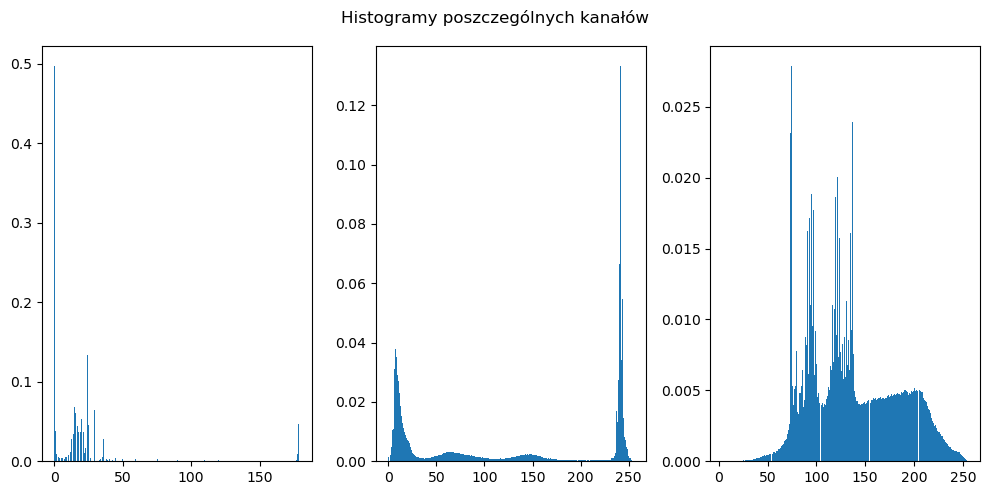

In [10]:
plt.figure(figsize=(10, 5))
plt.suptitle('Histogramy poszczególnych kanałów')

plt.subplot(1, 3, 1)
plt.hist(h2.flatten(), bins=256, density=True)

plt.subplot(1, 3, 2)
plt.hist(s2.flatten(), bins=256, density=True)

plt.subplot(1, 3, 3)
plt.hist(v2.flatten(), bins=256, density=True)

plt.tight_layout()

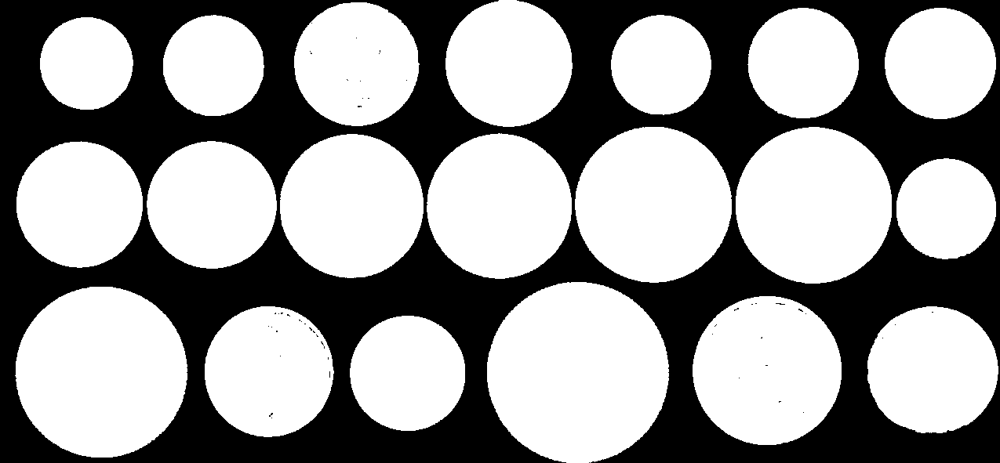

In [11]:
(T3, monety_kol_szum_bin) = cv2.threshold(s2, 200, 255, cv2.THRESH_BINARY_INV)
Image.fromarray(monety_kol_szum_bin)

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

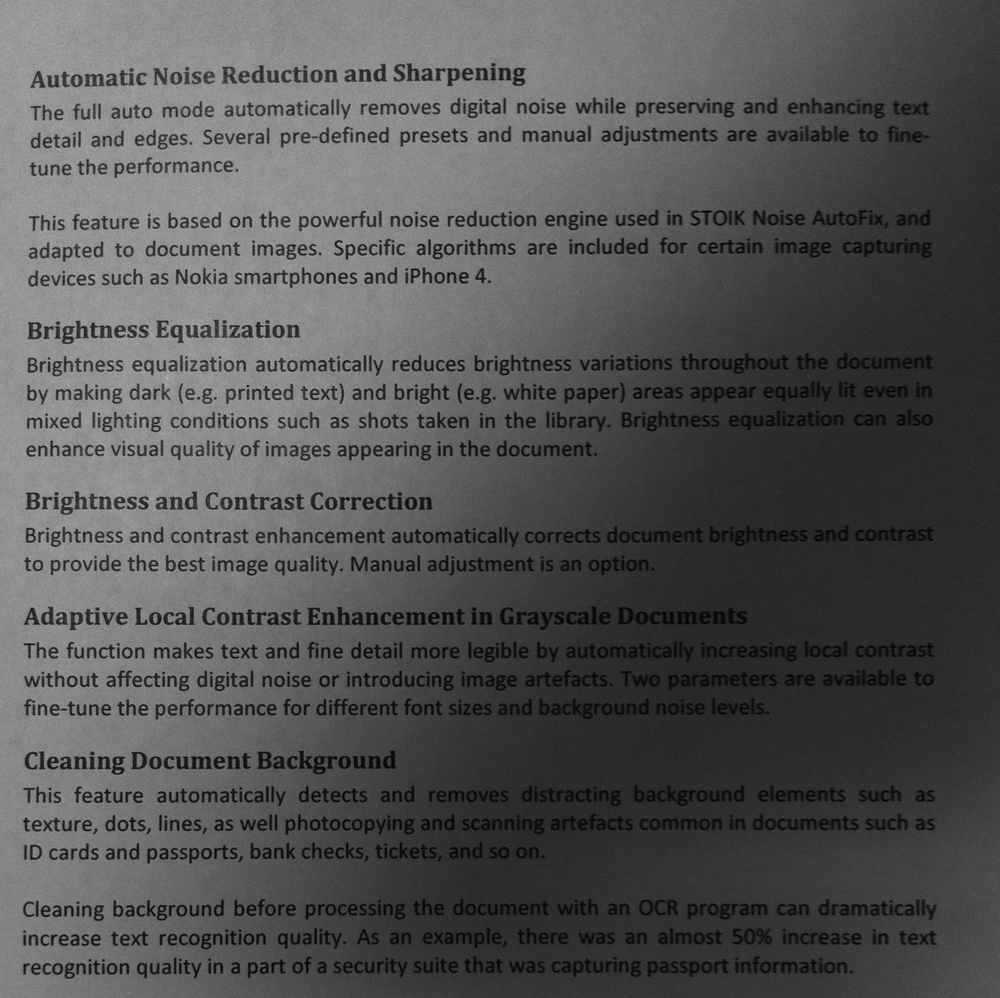

In [30]:
tekst = cv2.imread('Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [31]:
tekst_grey = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)

In [32]:
def otsu_window(img, size, epsilon=10):
    border_size = size // 2
    img_padded = cv2.copyMakeBorder(img, border_size, border_size, border_size, border_size, cv2.BORDER_REFLECT)

    h, w = img.shape[:2]
    output_image = np.zeros((h, w), dtype=np.uint8)

    for i in range(h):
        for j in range(w):
            window = img_padded[i:i + size, j:j + size]
            T, _ = cv2.threshold(window, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
            output_image[i, j] = 255 if img[i, j] + epsilon > T else 0

    return output_image


Text(0.5, 1.0, 'epsilon = 10')

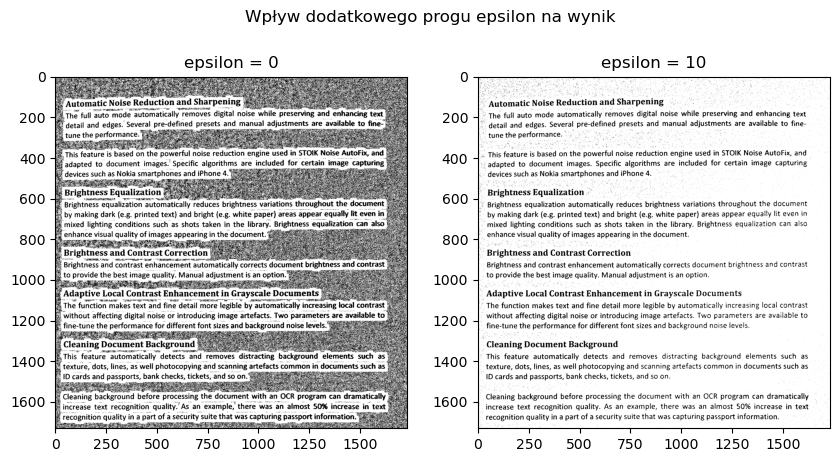

In [53]:
plt.figure(figsize=(10, 5))
plt.suptitle('Wpływ dodatkowego progu epsilon na wynik')

plt.subplot(1, 2, 1)
plt.imshow(otsu_window(tekst_grey, 30, 0), cmap='gray')
plt.title('epsilon = 0')

plt.subplot(1, 2, 2)
plt.imshow(otsu_window(tekst_grey, 30), cmap='gray')
plt.title('epsilon = 10')

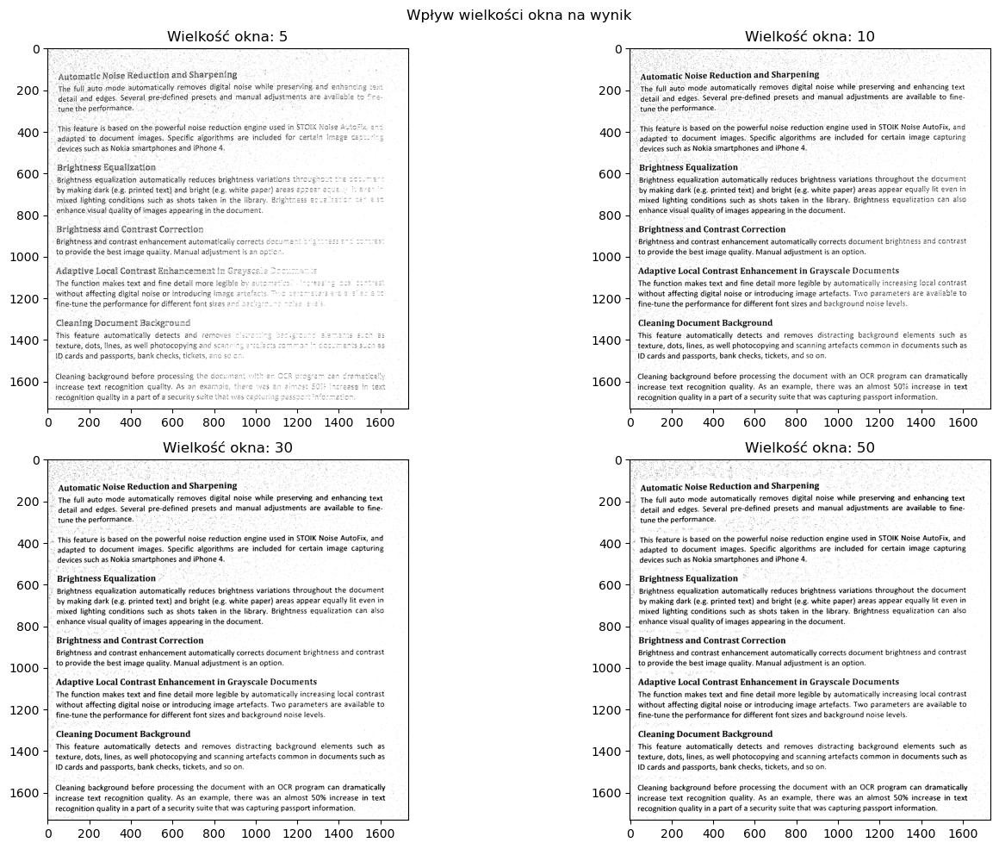

In [57]:
plt.figure(figsize = (15, 10))
plt.suptitle('Wpływ wielkości okna na wynik')

for i, ws in enumerate([5, 10, 30, 50]):
    plt.subplot(2, 2, i + 1)  
    plt.imshow(otsu_window(tekst_grey, ws), cmap='gray')
    plt.title('Wielkość okna: ' + str(ws))

plt.tight_layout()
plt.show()

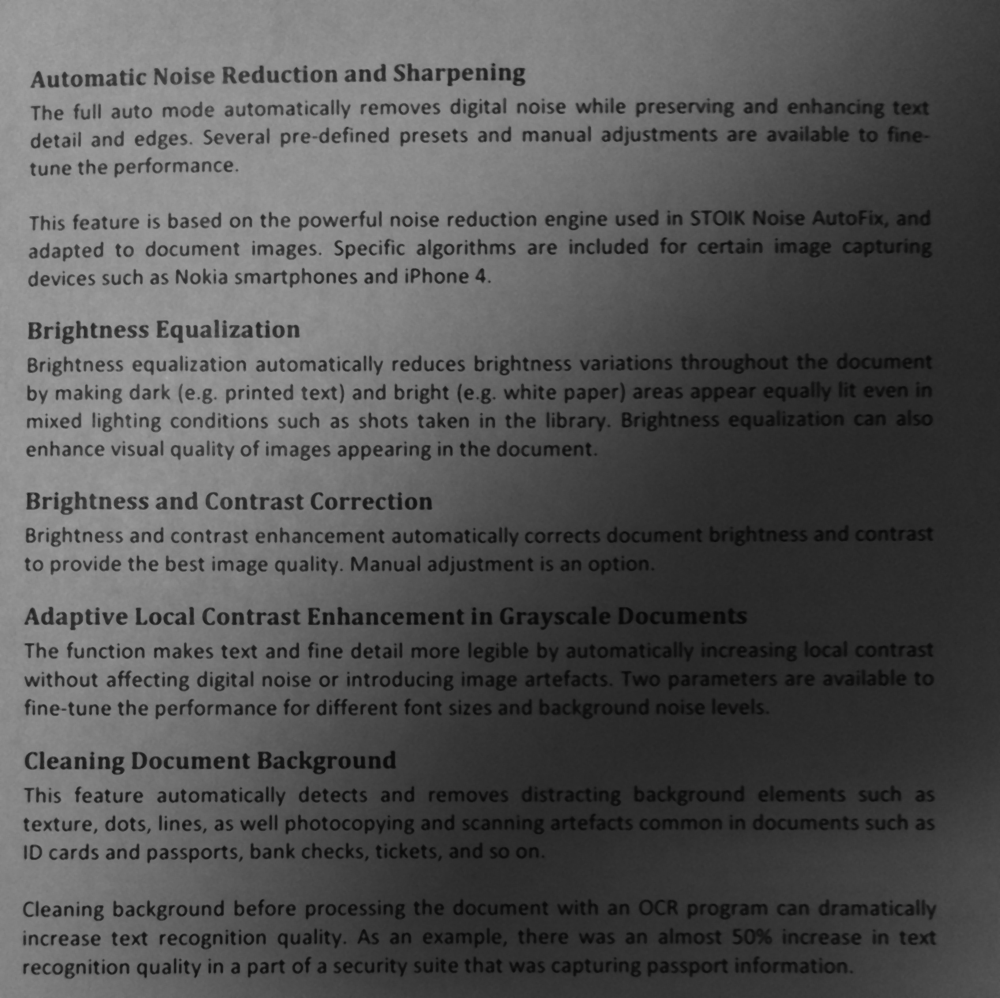

In [35]:
img_blur = img_blurred = cv2.medianBlur(tekst_grey, 5) 
Image.fromarray(img_blur)

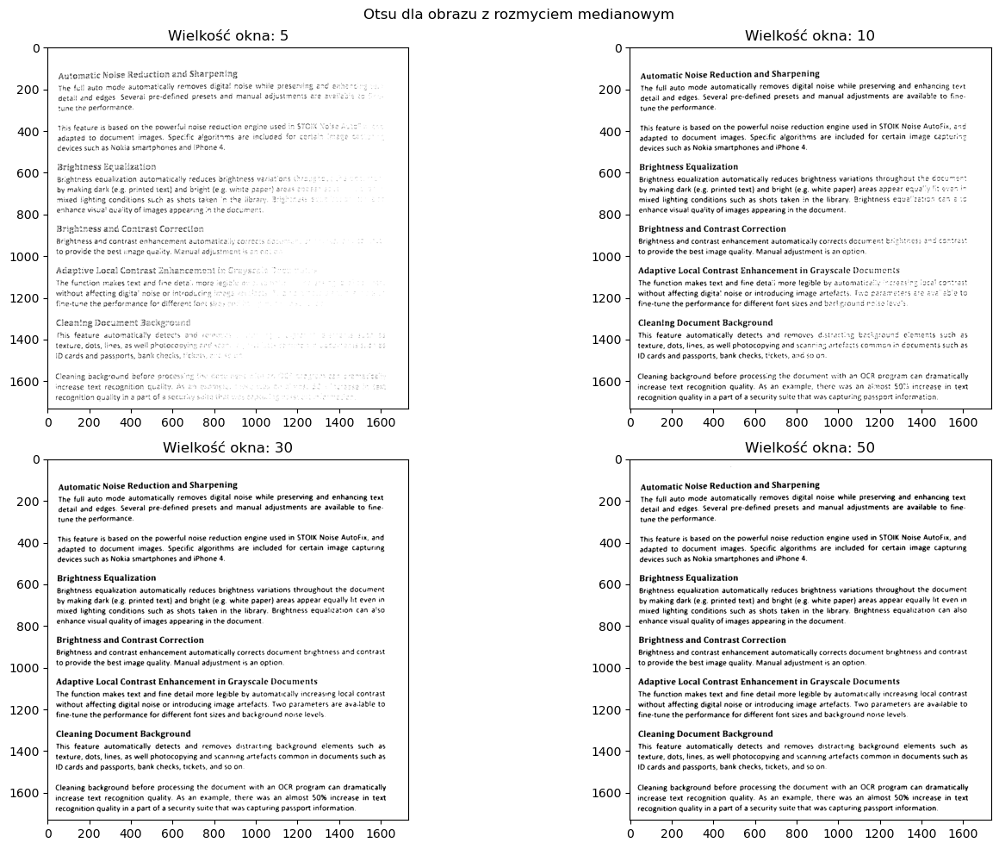

In [58]:
plt.figure(figsize = (15, 10))
plt.suptitle('Otsu dla obrazu z rozmyciem medianowym')

for i, ws in enumerate([5, 10, 30, 50]):
    plt.subplot(2, 2, i + 1)  
    plt.imshow(otsu_window(img_blur, ws), cmap='gray')
    plt.title('Wielkość okna: ' + str(ws))

plt.tight_layout()
plt.show()

In [316]:
def otsu_window2(img, size, epsilon=1):
    h, w = img.shape[:2]
    hs = size//2
    output_image = np.zeros((h, w), dtype=np.uint8)
    for i in range(h):
        for j in range(w):
            window = img[max(0, i-hs):min(h, i+hs), max(0, j-hs):min(w, j+hs)]
            T, _ = cv2.threshold(window, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
            output_image[i, j] = 255 if img[i, j] + epsilon > T else 0
    return output_image

In [323]:
a = otsu_window2(tekst_grey, 10, 10)

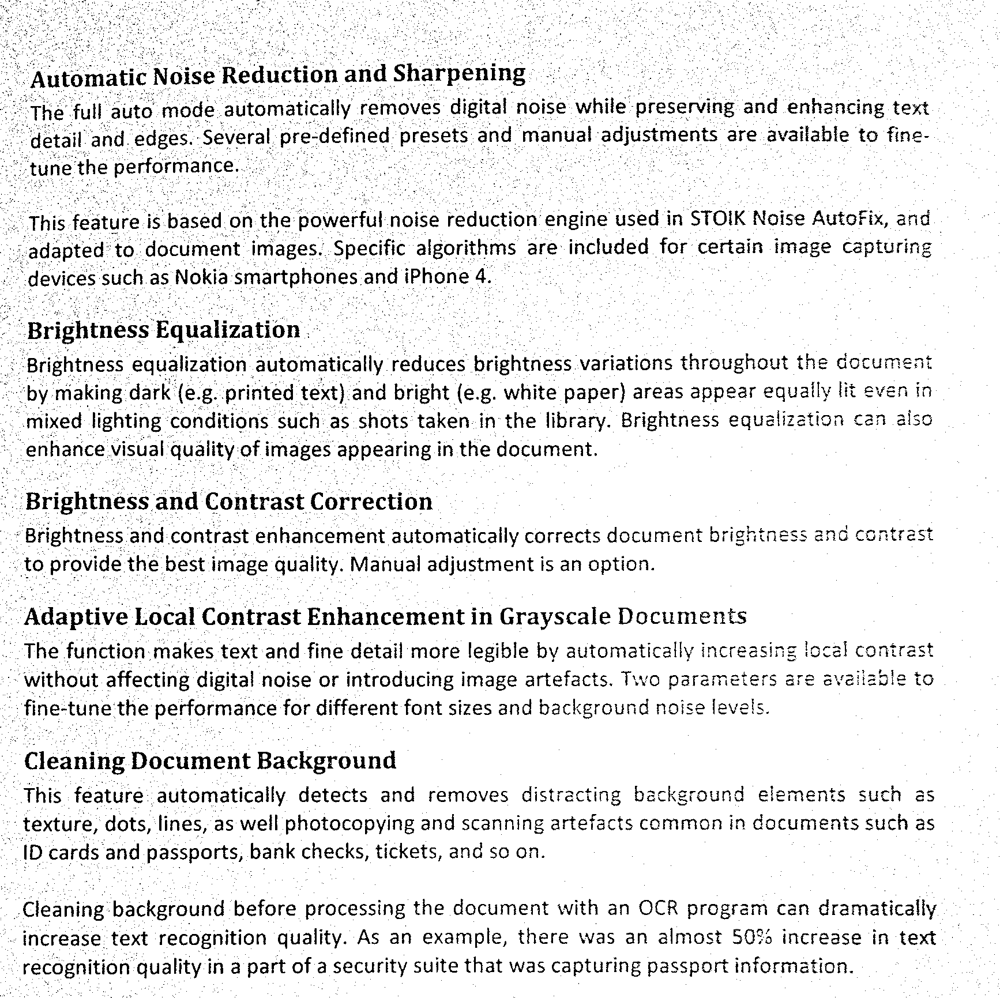

In [324]:
Image.fromarray(a)